In [1]:
import os 
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random

import splitfolders

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Conv2D,Dropout,Flatten,MaxPooling2D, BatchNormalization,Input,concatenate
from tensorflow.keras.callbacks import EarlyStopping,ReduceLROnPlateau
from tensorflow.keras.utils import plot_model
from sklearn.metrics import classification_report, confusion_matrix

In [2]:
base_path = "./asl_alphabet_train/"

#Category mapping
categories = {i: str(i) if i < 10 else chr(i + 87) for i in range(36)}

filenames_list = []
categories_list = []

#Collect filenames and categories
for category, label in categories.items():
    folder_path = os.path.join(base_path, label)
    if os.path.exists(folder_path):
        filenames = os.listdir(folder_path)
        filenames_list.extend(filenames)
        categories_list.extend([label] * len(filenames))

# Create DataFrame with filenames and categories
df = pd.DataFrame({"filename": filenames_list, "category": categories_list})

# Modify filenames
def add_class_name_prefix(df, col_name):
    def process_filename(x):
        match = re.search("_", x)
        return f"{x[match.start() + 1]}/{x}" if match else x

    df[col_name] = df[col_name].apply(process_filename)
    return df

df = add_class_name_prefix(df, "filename")

df = df.sample(frac=1, random_state=42).reset_index(drop=True)

In [9]:
df.head(20)

,filename,category
0,M2678.jpg,m
1,E (1350).jpg,e
2,L (855).jpg,l
3,W1305.jpg,w
4,U1427.jpg,u
5,U (57).jpg,u
6,B (3352).jpg,b
7,V (3045).jpg,v
8,Q205.jpg,q
9,F (1882).jpg,f


In [4]:
print("Number of elements = ", len(df))

Number of elements =  206137


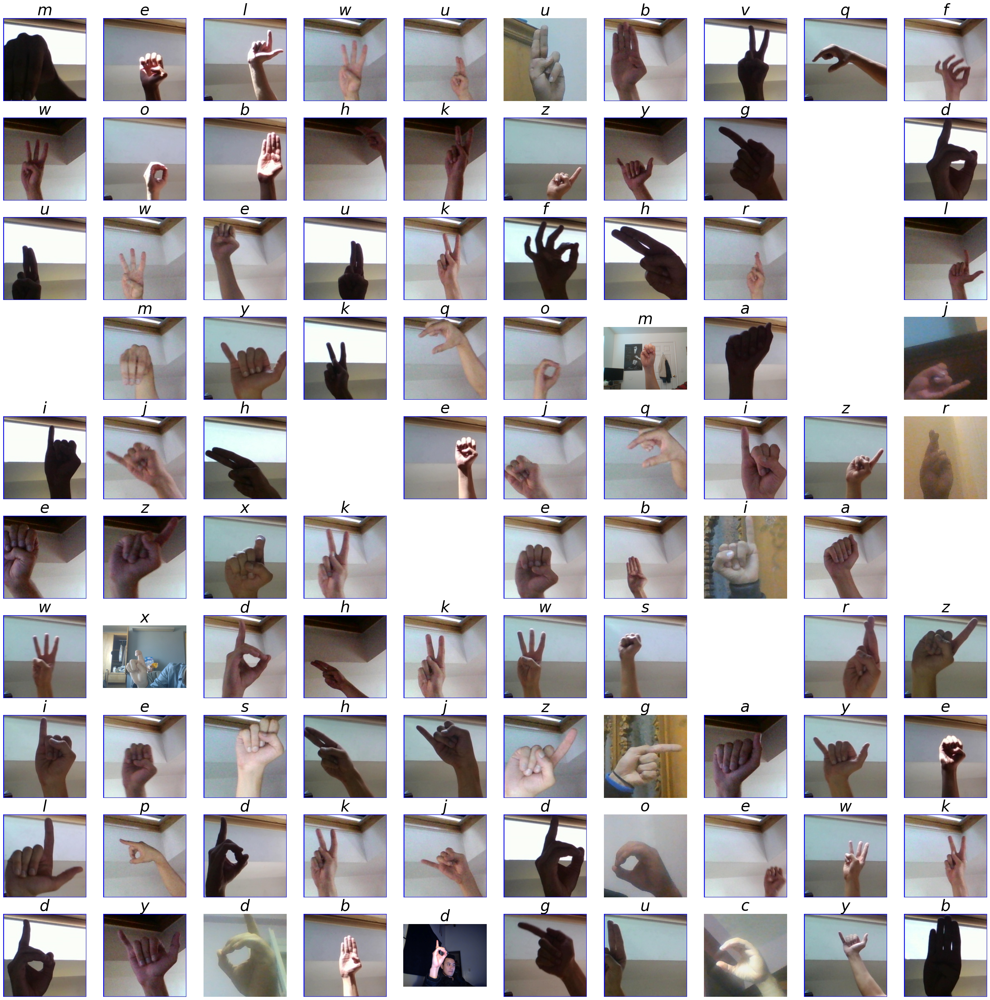

In [12]:
plt.figure(figsize=(40, 40)) 

for i in range(min(100, len(df))):
    path = os.path.join(base_path, df.category[i], df.filename[i])
    if not os.path.exists(path):
        continue

    img = plt.imread(path)
    plt.subplot(10, 10, i + 1)
    plt.imshow(img)
    plt.title(df.category[i], fontsize=35, fontstyle='italic')
    plt.axis("off")

plt.show()

In [13]:
splitfolders.ratio('./asl_alphabet_train',output='./asl_split', seed=1333, ratio=(0.8,0.1,0.1))

Copying files: 223074 files [10:19, 360.10 files/s]


In [14]:
data = ImageDataGenerator(
    rescale=1.0/255, 
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

In [21]:
train_path = './asl_split/train'
val_path = './asl_split/val'
test_path = './asl_split/test'

batch = 32
image_size = 200
img_channel = 3
n_classes = 29

In [22]:
train_data = data.flow_from_directory(directory= train_path, target_size=(image_size,image_size), batch_size = batch, class_mode='categorical')

val_data = data.flow_from_directory(directory= val_path, target_size=(image_size,image_size), batch_size = batch, class_mode='categorical')

test_data = data.flow_from_directory(directory= test_path, target_size=(image_size,image_size), batch_size = batch, class_mode='categorical',shuffle= False)

Found 178447 images belonging to 29 classes.
Found 22295 images belonging to 29 classes.
Found 22332 images belonging to 29 classes.


In [24]:
model = Sequential()
# input layer

# Block 1
model.add(Conv2D(32,3,activation='relu',padding='same',input_shape = (image_size,image_size,img_channel)))
model.add(Conv2D(32,3,activation='relu',padding='same'))
#model.add(BatchNormalization())
model.add(MaxPooling2D(padding='same'))
model.add(Dropout(0.2))

# Block 2
model.add(Conv2D(64,3,activation='relu',padding='same'))
model.add(Conv2D(64,3,activation='relu',padding='same'))
#model.add(BatchNormalization())
model.add(MaxPooling2D(padding='same'))
model.add(Dropout(0.3))

#Block 3
model.add(Conv2D(128,3,activation='relu',padding='same'))
model.add(Conv2D(128,3,activation='relu',padding='same'))
#model.add(BatchNormalization())
model.add(MaxPooling2D(padding='same'))
model.add(Dropout(0.4))

# fully connected layer
model.add(Flatten())

model.add(Dense(512,activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(128,activation='relu'))
model.add(Dropout(0.3))

# output layer
model.add(Dense(29, activation='softmax'))

model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_12 (Conv2D)              │ (None, 200, 200, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 200, 200, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 100, 100, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 100, 100, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 100, 100, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 100, 100, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 50, 50, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 50, 50, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 50, 50, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 50, 50, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 25, 25, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 25, 25, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 80000)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 512)            │    40,960,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 29)             │         3,741 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 41,316,925 (157.61 MB)

 Trainable params: 41,316,925 (157.61 MB)

 Non-trainable params: 0 (0.00 B)

In [25]:
early_stopping = EarlyStopping(monitor='val_loss', min_delta=0.001,patience= 5,restore_best_weights= True, verbose = 0)

reduce_learning_rate = ReduceLROnPlateau(monitor='val_accuracy', patience = 2, factor=0.5 , verbose = 1)

In [26]:
model.compile(optimizer='adam', loss='categorical_crossentropy' , metrics=['accuracy'])

In [28]:
asl_class = model.fit(train_data, 
                      validation_data=val_data, 
                      epochs=10, 
                      callbacks=[early_stopping, reduce_learning_rate], 
                      verbose=1)


Epoch 1/10
 500/5577 ━━━━━━━━━━━━━━━━━━━━ 25:32:00 18s/step - accuracy: 0.0379 - loss: 3.3613

KeyboardInterrupt: 

In [ ]:
#Evaluate for train generator
loss,acc = model.evaluate(train_data , verbose = 0)

print('The Accuracy of the model for training data is:',acc*100)
print('The Loss of the model for training data is:',loss)

#Evaluate for validation generator
loss,acc = model.evaluate(val_data, verbose = 0)

print('The Accuracy of the model for validation data is:',acc*100)
print('The Loss of the model for validation data is:',loss)

In [ ]:
# Plotting Accuracy and Loss with epochs
error = pd.DataFrame(asl_class.history)

plt.figure(figsize=(18,5),dpi=200)
sns.set_style('darkgrid')

plt.subplot(121)
plt.title('Cross Entropy Loss',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Loss',fontsize=12)
plt.plot(error['loss'])
plt.plot(error['val_loss'])

plt.subplot(122)
plt.title('Classification Accuracy',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Accuracy',fontsize=12)
plt.plot(error['accuracy'])
plt.plot(error['val_accuracy'])

plt.show()

In [ ]:
result = model.predict(test_data,verbose = 0)

y_pred = np.argmax(result, axis = 1)

y_true = test_data.labels

loss,acc = model.evaluate(test_data,verbose = 0)

print('The Accuracy of the model for testing data is:',acc*100)
print('The Loss of the model for testing data is:',loss)

In [ ]:
p = y_pred
y = y_true
correct = np.nonzero(p==y)[0]
incorrect = np.nonzero(p!=y)[0]

print("Correct predicted classes:",correct.shape[0])
print("Incorrect predicted classes:",incorrect.shape[0])

In [ ]:
print(classification_report(y_true, y_pred,target_names= categories.values()))

In [ ]:
sns.set_style('ticks')

confusion_mtx = confusion_matrix(y_true,y_pred) 

f,ax = plt.subplots(figsize = (20,8),dpi=200)

sns.heatmap(confusion_mtx, annot=True, 
            linewidths=0.1, cmap = "gist_yarg_r", 
            linecolor="black", fmt='.0f', ax=ax, 
            cbar=False, xticklabels=categories.values(), 
            yticklabels=categories.values())

plt.xlabel("Predicted Label",fontdict={'color':'red','size':20})
plt.ylabel("True Label",fontdict={'color':'green','size':20})
plt.title("Confusion Matrix",fontdict={'color':'brown','size':25})

plt.show()